In [ ]:
from google.colab import drive
drive.mount('/content/MyDrive')

Mounted at /content/MyDrive


In [ ]:
import os
import cv2
from PIL import Image
import json

In [ ]:
with open('/content/MyDrive/MyDrive/pooled_new_data.json','r') as f:
  annotations = json.load(f)
  f.close()

In [ ]:
def compute_bbox_area(bbox):
    x1,y1,x2,y2 = bbox[0][0],bbox[0][1],bbox[2][0],bbox[2][1]
    area = (x2 - x1) * (y2 - y1)
    return area

# Compute and append bbox areas to the JSON
for image_name in annotations:
  area_json = []
  for polygon in annotations[image_name]['polygons']:
      bbox_area = compute_bbox_area(polygon)
      area_json.append(bbox_area)
  annotations[image_name]['polygons_area'] = area_json

# for image_name, info in annotations.items():
#     for bbox_info in info['bboxes']:
#         bbox_area = compute_bbox_area(bbox_info['bbox'])
#         bbox_info['area'] = bbox_area

# Save the updated JSON
with open('/content/MyDrive/MyDrive/pooled_new_data_area.json', 'w') as f:
    json.dump(annotations, f, indent=4)

In [ ]:
len(annotations)

2403

In [ ]:
print(annotations)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
def find_top_n_largest_bboxes(annotations, image_name, n):
    if image_name not in annotations:
        return None
    bounding_boxes = annotations[image_name].get('polygons', [])
    bounding_boxes_area = annotations[image_name].get('polygons_area', [])
    if not bounding_boxes or not bounding_boxes_area:
        return None
    sorted_bboxes = sorted(enumerate(bounding_boxes), key=lambda x: bounding_boxes_area[x[0]], reverse=True)
    # Get the top-n largest bounding boxes
    top_n_bboxes = sorted_bboxes[:n]
    top_n_indices = [bbox[0] for bbox in top_n_bboxes]
    top_n_bboxes = [bbox[1] for bbox in top_n_bboxes]
    top_n_bboxes_area = [bounding_boxes_area[i] for i in top_n_indices]

    return top_n_indices, top_n_bboxes, top_n_bboxes_area


n_indexes,n_boxes,n_boxes_area = find_top_n_largest_bboxes(annotations,'164_25.jpg',3)


In [ ]:
print(n_indexes)
print(n_boxes)
print(n_boxes_area)

[0, 1, 2, 254]
[[[412, 622], [412, 1163], [2220, 1163], [2220, 622]], [[450, 1182], [450, 1389], [1262, 1389], [1262, 1182]], [[1300, 1200], [1300, 1413], [1758, 1413], [1758, 1200]], [[2234, 4515], [2234, 4621], [2820, 4621], [2820, 4515]]]
[978128, 168084, 97554, 62116]


In [ ]:
print(n_boxes[0][1])

[490, 1494]


In [ ]:
# y_min_1st = min(bbox[1] for bbox in top_n_bboxes)

for bbox in n_boxes:
  print(bbox[0][1]) #this is y_min
  print(bbox[1][1]) #y_max

873
1494
4198
4618
578
983
4678
4896
578
988


In [ ]:
def assess_augmentation_required(annotations, image_name, max_area_factor):
    if image_name not in annotations:
        return 0
    bounding_boxes_area = annotations[image_name].get('polygons_area', [])
    if not bounding_boxes_area:
        return False
    max_area = max(bounding_boxes_area)
    avg_area = sum(bounding_boxes_area) / len(bounding_boxes_area)
    if max_area - avg_area > max_area_factor * avg_area:
        return True
    else:
        return False
# # Example usage
# annotations = {
#     '106_1.jpg': {'polygons_area': [50, 60, 80, 100, 120]}
# }

image_name = '164_25.jpg'
max_area_factor = 6

augmentation_required = assess_augmentation_required(annotations, image_name, max_area_factor)
print("Augmentation Required:", augmentation_required)


Augmentation Required: True


Image Testing samples
106_1,106_2,36_7,36_10,36_11 correct

anomalies:109_1,145_24
109_8
109_60

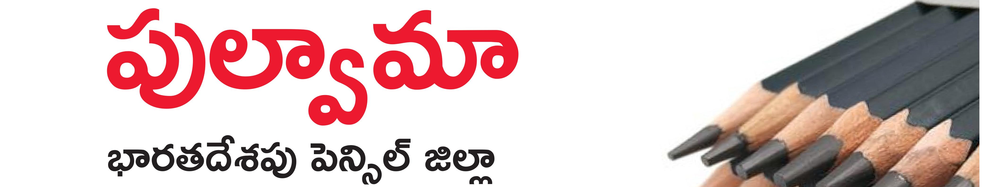

In [ ]:
import os
import json
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
def crop_by_title_range(image_path, annotations_json, top_n_bboxes, padding_factor=0.1):
    # Load annotations from JSON
    # with open(annotations_json, 'r') as f:
    #     annotations = json.load(f)

    image = cv2.imread(image_path)

    #Calculate y_min_1st and y_max_last based on top_n_bboxes
    y_min_1st = min(bbox[0][1] for bbox in top_n_bboxes)
    y_max_last = max(bbox[1][1] for bbox in top_n_bboxes)

    #Calculate the padding based on the average y_min of all bounding boxes
    avg_y_min = np.mean([bbox[0][1] for bbox in top_n_bboxes])
    padding = int(padding_factor * avg_y_min)
    cropped_image = image[y_min_1st:y_max_last, :]

    return cropped_image

# Example usage
image_path = '/content/164_25.jpg'
annotations_json = 'path/to/annotations.json'
# top_n_bboxes = [(x1, y1, width, height), ...]  # List of top_n bounding boxes
cropped_image = crop_by_title_range(image_path, annotations_json, n_boxes)

cv2.imwrite('output_image.jpg', cropped_image)
cv2_imshow(cropped_image)

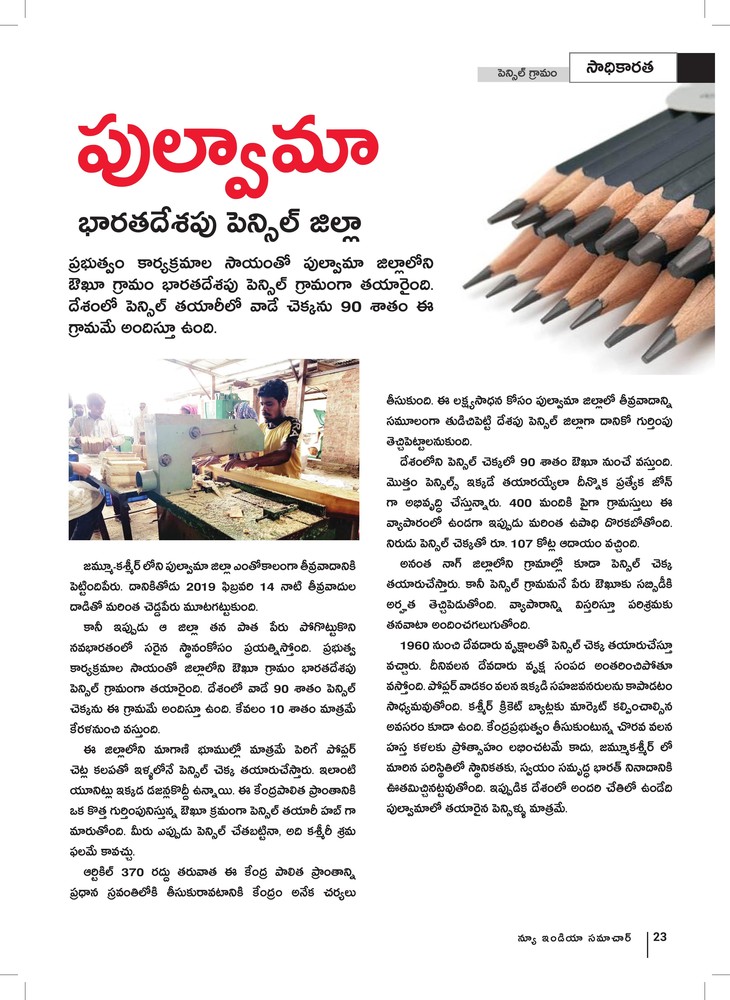

In [ ]:
image = cv2.imread('/content/164_25.jpg')
cv2_imshow(image)

In [ ]:
n_indexes,n_boxes,n_boxes_area = find_top_n_largest_bboxes(annotations,'163_1.jpg',3)
print(n_boxes)
print(n_boxes_area)

[[[672, 704], [672, 1365], [3601, 1365], [3601, 704]], [[322, 4303], [322, 4719], [1638, 4719], [1638, 4303]], [[1459, 3812], [1459, 4282], [2514, 4282], [2514, 3812]]]
[1936069, 547456, 495850]
